<p style="font-family: Arial; font-size:3.75em;color:purple; font-style:bold"><br>
numpy Library with Satellite Image Data:
</p><br>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Data Source: Satellite Image from WIFIRE Project <br><br>
WIFIRE Project website: https://wifire.ucsd.edu/ <br>
</p><br><br>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Libraries needed: numpy, scipy, matplotlib</p>

In [1]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

<p style="font-family: Arial; font-size:2.75em;color:purple; font-style:bold"><br>

Creating a numpy array from an image file<br><br></p>


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Let us load a satellite image from WIFIRE Project Dataset: https://wifire.ucsd.edu/</p>

In [2]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

type(photo_data)

numpy.ndarray

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
RED Pixel intensity denotes altitude (higher value => more height) <br><br>
BLUE Pixel intensity denotes Aspect <br><br>
GREEN Pixel intensity denotes Slope <br><br>
</p>



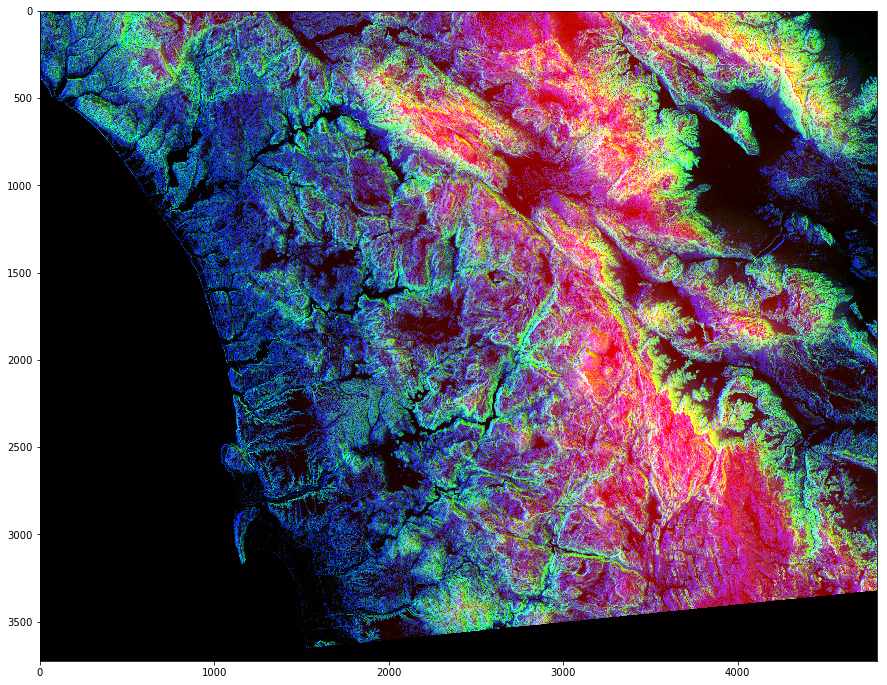

In [3]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [4]:
# The first two numbers here are lenght and width
# The third number (i.e. 3) is for three layers: Red, Green and Blue

photo_data.shape

(3725, 4797, 3)

In [5]:
photo_data.size

53606475

In [6]:
photo_data.min(), photo_data.max()

(0, 255)

In [7]:
photo_data.mean()

75.829935450894695

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Pixel on the 150th row and 250th column</p>

In [8]:
photo_data[150, 250]

array([ 17,  35, 255], dtype=uint8)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Set to zero (however, setting one pixel to zero is not noticeable) </p>

In [9]:
photo_data[150, 250] = 0

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

So, let's try something bigger !
Set to 255 : all pixels in a range </p>

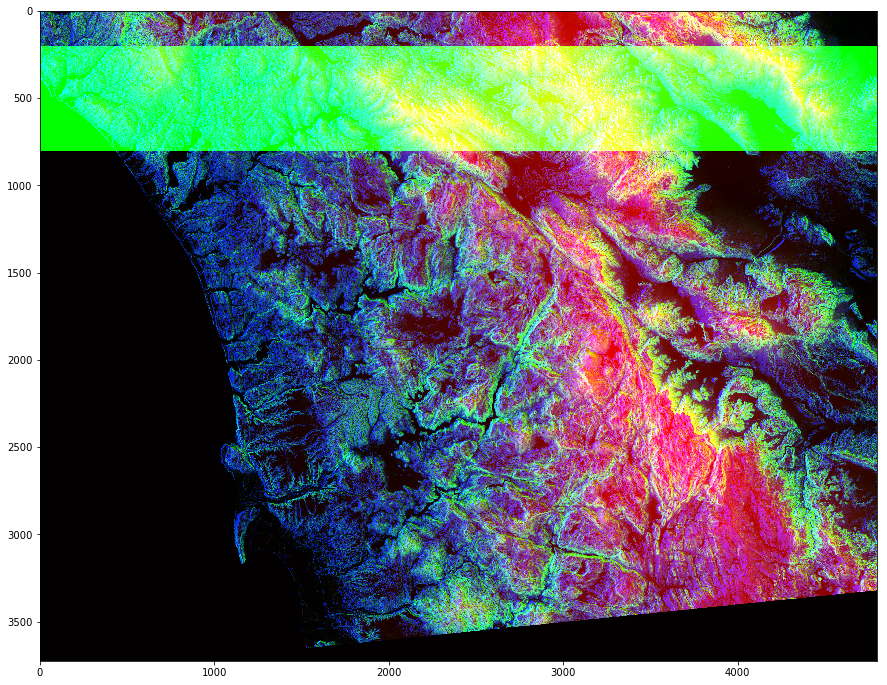

In [10]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, : ,1] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Pick all pixels with low values</p>

In [11]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
sieve = photo_data < 50
sieve.shape

(3725, 4797, 3)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Whenever the sieve is True: set value to 0 </p>

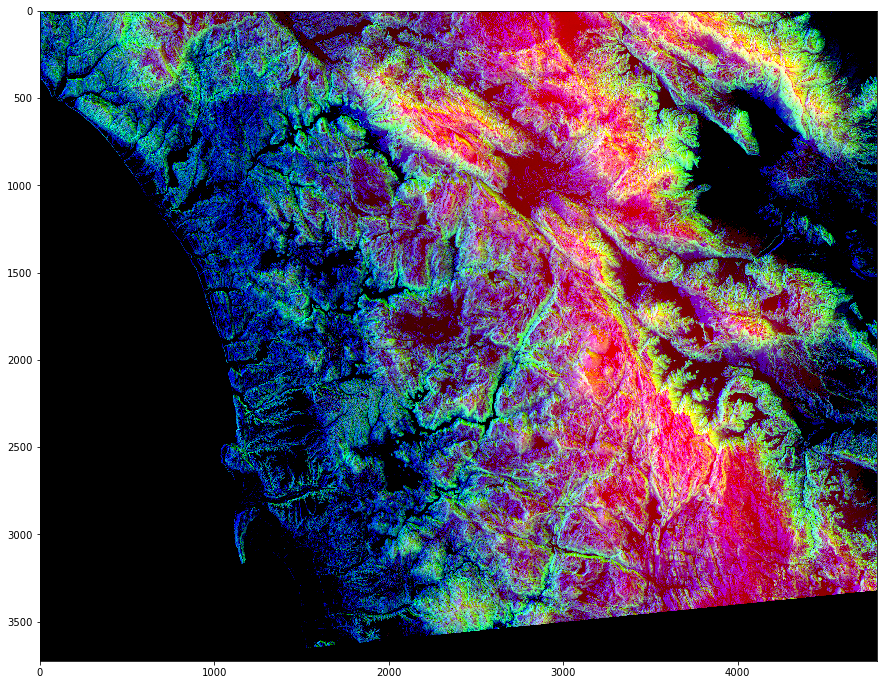

In [12]:
import random
photo_data[sieve] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

You can design complex patters by making cols a function of rows or vice-versa <br><br>
Here we try a linear relationship between rows and cols </p>

In [13]:
rows = np.arange(len(photo_data))
cols = rows

In [14]:
photo_data[rows, cols] = 255

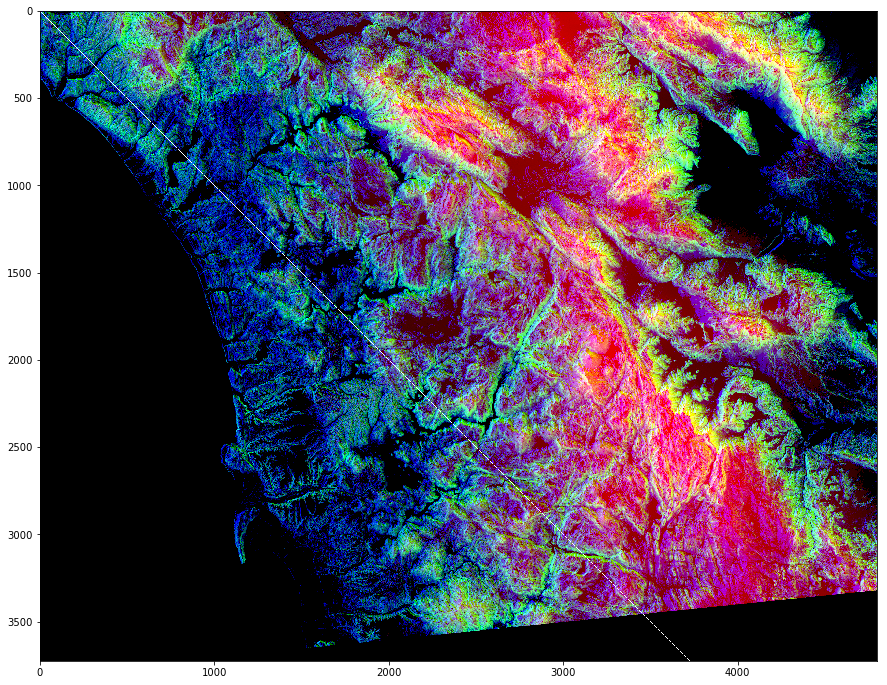

In [15]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Let us try something cool...a mask that is in shape of a circular disc </p>

In [16]:
total_rows, total_cols, total_layers = photo_data.shape

X, Y = np.ogrid[:total_rows, :total_cols]

In [17]:
center_row, center_col = total_rows / 2, total_cols / 2

dist_from_center = (X - center_row)**2 + (Y - center_col)**2
radius = (total_rows / 2)**2
circular_sieve = (dist_from_center > radius)

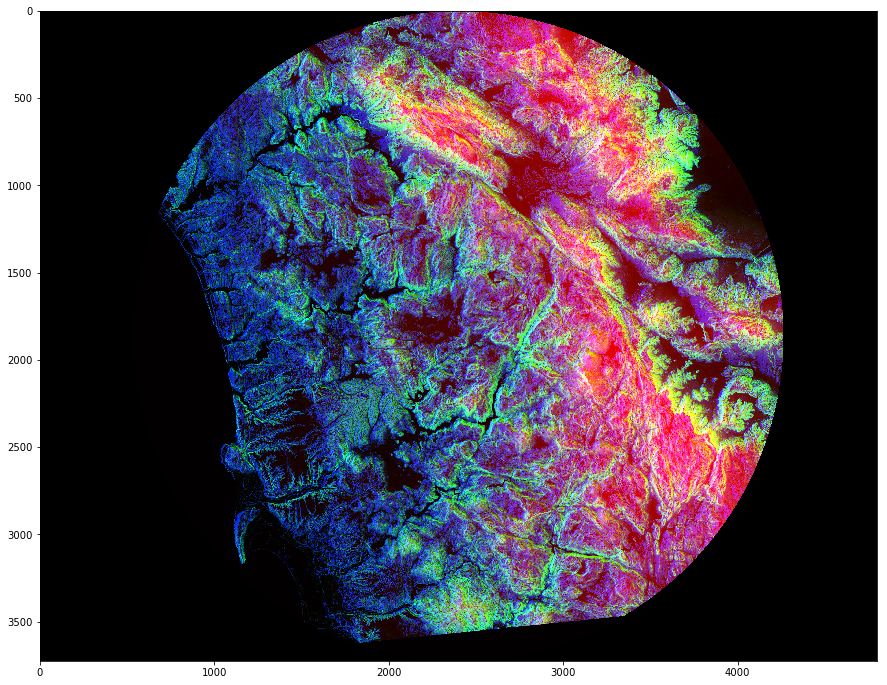

In [18]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[circular_sieve] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
You can further improve the mask, for example just get upper half disc </p>

In [19]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_sieve = np.logical_and(half_upper, circular_sieve)

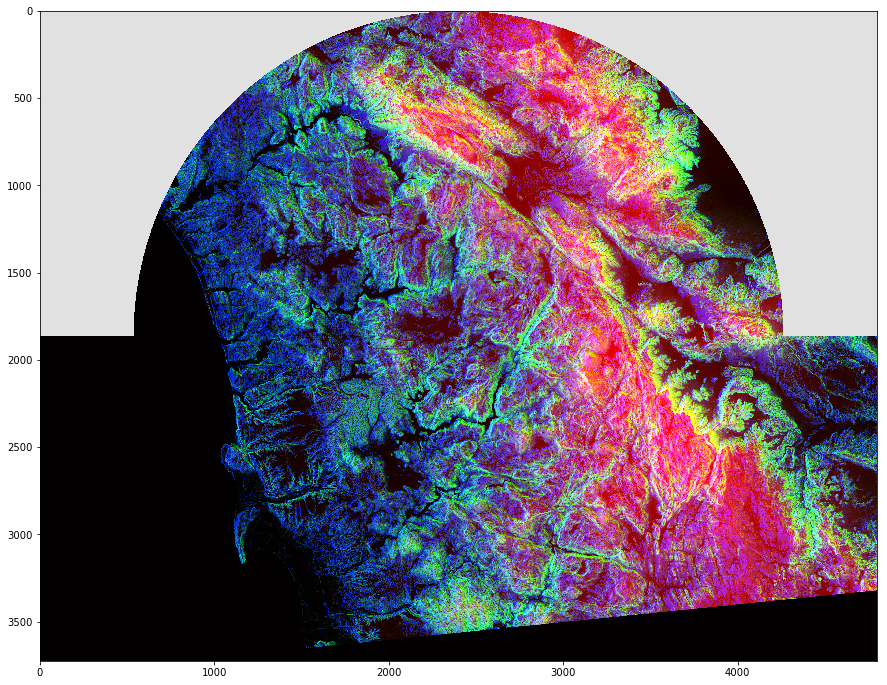

In [20]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[half_upper_sieve] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<br><br><br><p style="font-family: Arial; font-size:2.75em;color:purple; font-style:bold"><br>
Let us try to do something fancy <br><br>with this Satellite Image </p><br><br><br><br>



<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

RED Pixels tell us about the height: let us try to highlight all the high altitude areas <br><br>
Detect highly RED Pixels by lighting down other areas: </p>

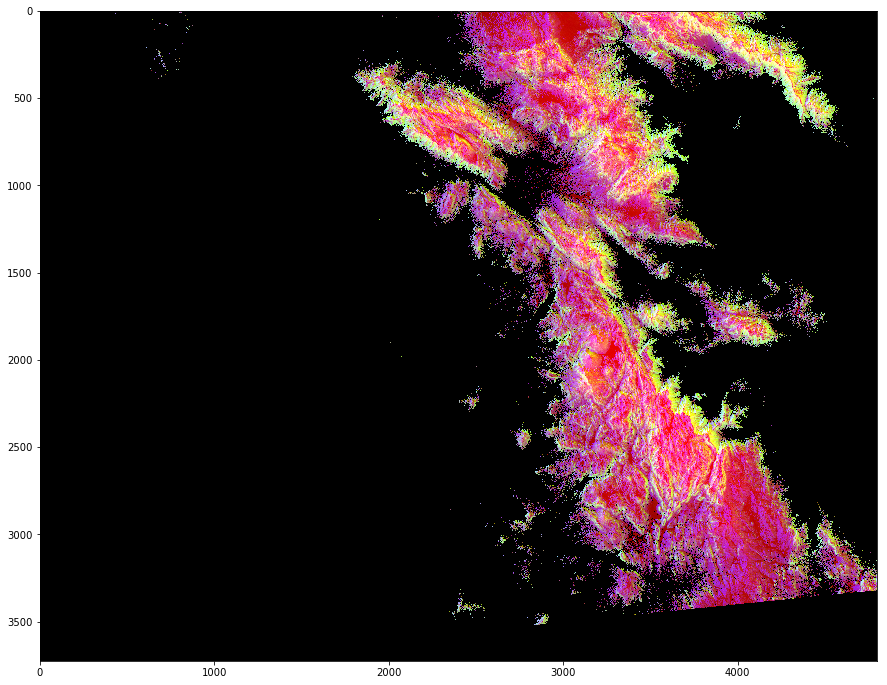

In [21]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
red_mask   = photo_data[:, : ,0] <150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detect highly GREEN Pixels by lighting down other areas: </p>

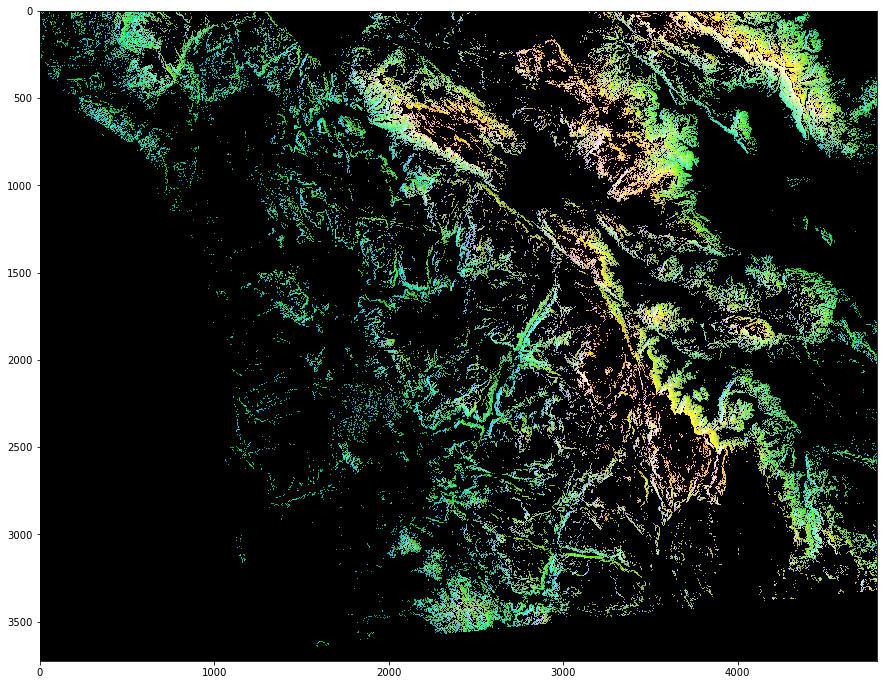

In [22]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
green_mask = photo_data[:, : ,1] <150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detect highly BLUE Pixels by lighting down other areas: </p>

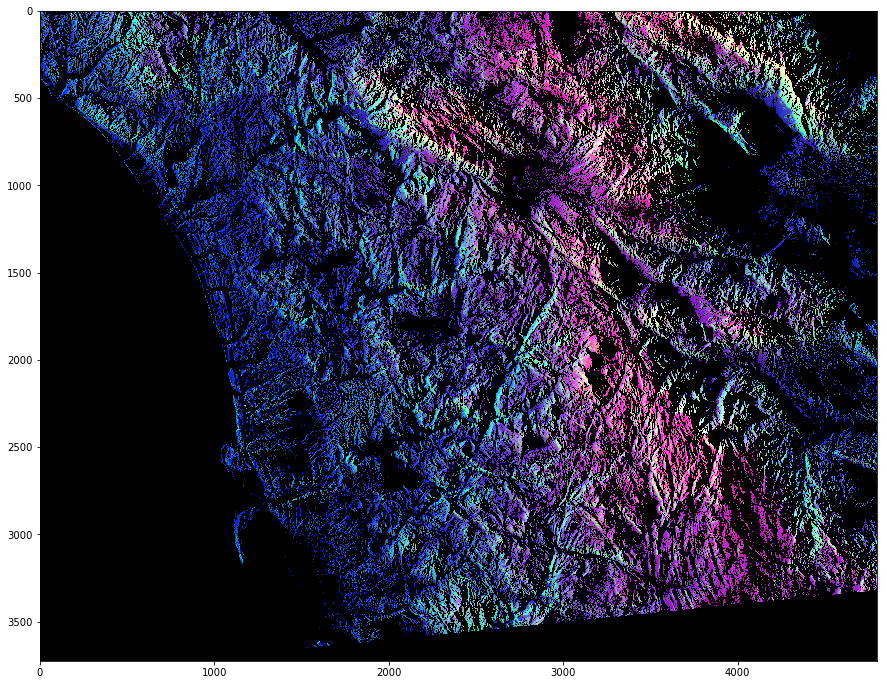

In [23]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
blue_mask  = photo_data[:, : ,2] <150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

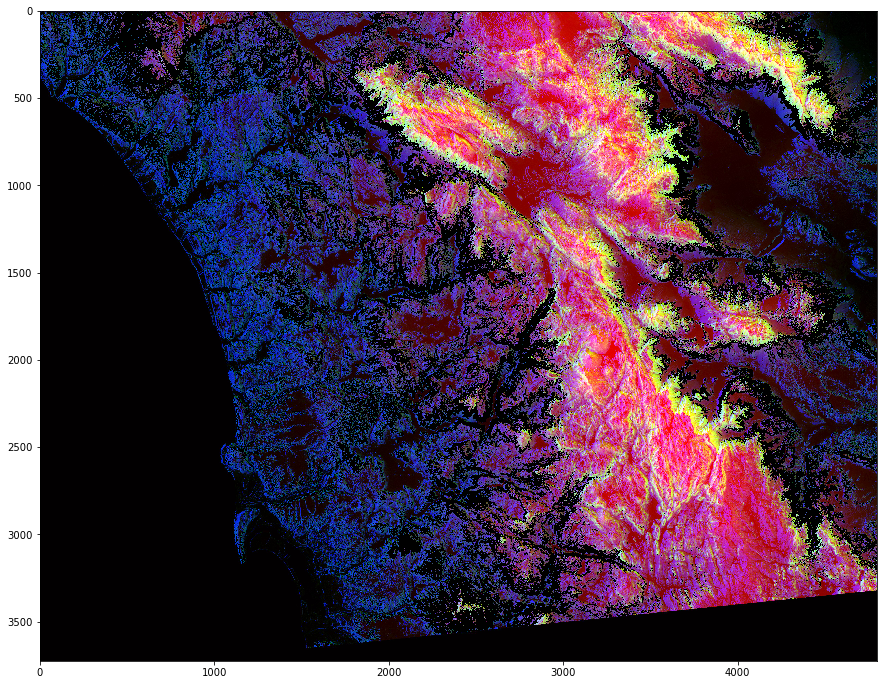

In [24]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

red_mask   = photo_data[:, : ,0] <150
green_mask = photo_data[:, : ,1] >100
blue_mask  = photo_data[:, : ,2] <100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)